In [1]:
from dask_image.imread import imread
import matplotlib.pyplot as plt
import pims
import btrack
import trackpy as tp
import numpy as np
import pandas as pd
import napari
import skimage
from skimage.measure import label, regionprops, regionprops_table

def make_labels_trackpy_links(image,j,size=5,_round=False):
    import trackpy as tp
    import scipy.ndimage as ndi
    from scipy.ndimage import binary_dilation


    #outputsomehow is 3D, we want 2
    coords = np.dstack((round(j.y),round(j.x)))[0].astype(int)

    #this is super slow
    # ~ masks = tp.masks.mask_image(coords,np.ones(image.shape),size/2)

    #This is faster
    r = (size-1)/2 # Radius of circles
    #make 3D compat
    disk_mask = tp.masks.binary_mask(r,image.ndim)
    # Initialize output array and set the maskcenters as 1s
    out = np.zeros(image.shape,dtype=bool)
    #check if there's a problem with subpixel masking
    out[coords[:,0],coords[:,1]] = 1
    # Use binary dilation to get the desired output
    out = binary_dilation(out,disk_mask)


    labels, nb = ndi.label(out)
    if _round:
        return labels, coords
    else:
        if image.ndim == 2:
            coords = j.loc[:,['particle','frame','y','x']]
#             coords = np.dstack((j.particle,j.y,j.x))[0]
            return labels, coords
#     return labels, coords

def make_masks(positions,r=3,ndims=2):
    import trackpy as tp
    if ndims == 2:
        r = (size-1)/2 # Radius of circles
        #make 3D compat
        disk_mask = tp.masks.binary_mask(r,np.zeros(ndim))
        # Initialize output array and set the maskcenters as 1s
        out = np.zeros(image.shape,dtype=bool)
        #check if there's a problem with subpixel masking
        out[coords[:,0],coords[:,1]] = 1
        # Use binary dilation to get the desired output
        out = binary_dilation(out,disk_mask)
        labels, nb = ndi.label(out)

        if _round:
            return labels, coords
        else:
            if image.ndim == 2:
                coords = np.dstack((f.y,f.x))[0]
                return labels, coords
    elif image.ndim == 3:
            coords = np.dstack((f.z,f.y,f.x))[0]
            return None, coords


In [2]:
reader = pims.Bioformats('/home/jmamede/anwar/1_Hydroxyurea_HU/Full_Track/December-02-2022/B2_HU750_G500_35ul02_2_R3D_D3D_PRJ.dv')
reader

/home/jmamede/anaconda3/envs/tensorflow/lib/python3.9/site-packages/pims/bioformats.py:410: UserWarning: Due to an issue with JPype 0.6.0, reading is slower. Please consider upgrading JPype to 0.6.1 or later.
  warn('Due to an issue with JPype 0.6.0, reading is slower. '


<FramesSequenceND>
Axes: 4
Axis 'x' size: 480
Axis 'y' size: 480
Axis 'c' size: 3
Axis 't' size: 41
Pixel Datatype: <u2

In [3]:
for i in range(reader.metadata.ChannelCount(0)):
    print(reader.metadata.ChannelEmissionWavelength(0,i))

679.0
597.0
525.0


Frame([[[18033, 17938, 14191, ..., 15436, 16681, 13922],
        [14245, 19517, 18188, ..., 14272, 17992, 15680],
        [16871, 14753, 23536, ..., 16345, 12630, 16328],
        ...,
        [11955, 14513, 11091, ..., 12766, 18975, 15305],
        [15848, 20162, 15997, ..., 18381, 14393, 18004],
        [11202, 12555, 10573, ..., 12454, 12624, 17804]],

       [[14623, 18813, 17343, ..., 14562, 22651, 15761],
        [17078, 21470, 16096, ..., 15864, 16055, 13890],
        [15205, 21048, 18932, ..., 14911, 16434, 15901],
        ...,
        [11940, 11844, 11774, ..., 13165, 13195, 15130],
        [13922, 14301, 16613, ..., 12988, 16247, 17030],
        [11384, 15818, 13857, ..., 14945, 13093, 13787]],

       [[24169, 15398, 15919, ..., 20609, 16910, 13554],
        [17835, 17752, 15945, ..., 14114, 17389, 17150],
        [16661, 19949, 15921, ..., 14582, 19783, 19854],
        ...,
        [15261, 12049, 12781, ..., 13529, 16112, 14031],
        [12472, 19497, 15881, ..., 13163, 13467, 11432],
        [11802, 12804, 12757, ..., 13041, 17038, 14520]],

       ...,

       [[14714, 11813, 13286, ..., 24993, 17625, 16434],
        [20578, 15317, 19125, ..., 14234, 23124, 15617],
        [13385, 18397, 13604, ..., 13978, 15662, 15587],
        ...,
        [19808, 11825, 10205, ..., 12889, 13240, 25674],
        [15690, 13243, 11207, ..., 12142, 11986, 13864],
        [12165, 15035,  9541, ..., 14619, 13639, 13416]],

       [[14281, 16291, 19452, ..., 17354, 21212, 15562],
        [17264, 13640, 21452, ..., 14340, 16286, 14800],
        [15999, 12488, 11617, ..., 24041, 15757, 15116],
        ...,
        [14097, 10862, 11299, ..., 15375, 17822, 12216],
        [12817, 13558, 12124, ..., 13532, 15501, 16364],
        [16823, 12122, 12046, ..., 12768, 13991, 13033]],

       [[16190, 13126, 15137, ..., 14923, 12414, 14838],
        [17601, 11690, 14601, ..., 14122, 17233, 14722],
        [15659, 11987, 14355, ..., 13781, 12086, 15474],
        ...,
        [10350, 10335, 12350, ..., 14529, 12478, 13150],
        [13394, 14208, 12382, ..., 11717, 12384, 14081],
        [13282, 12443, 14816, ..., 13903, 18888, 15851]]], dtype=uint16)
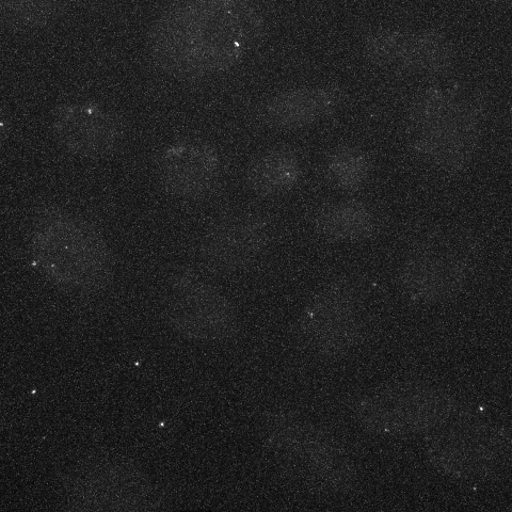
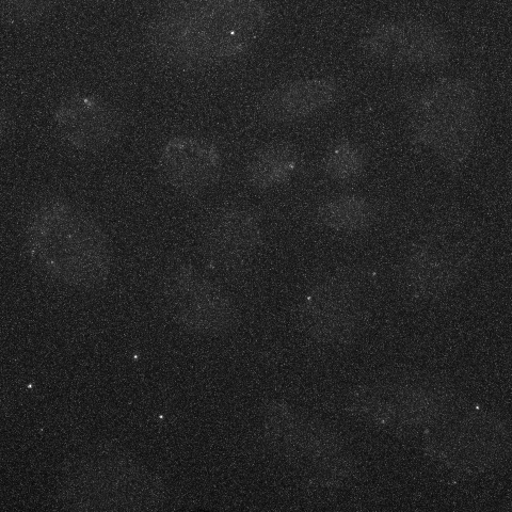
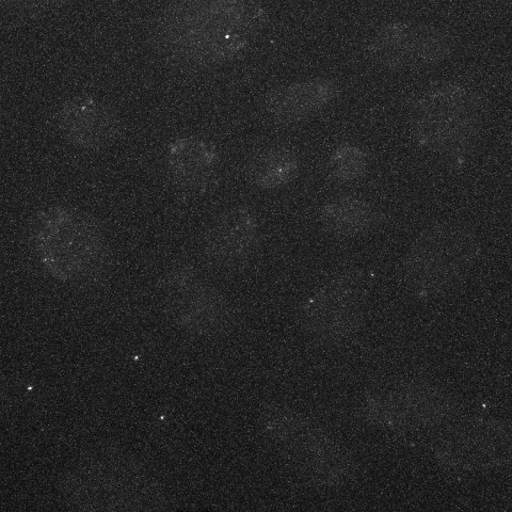
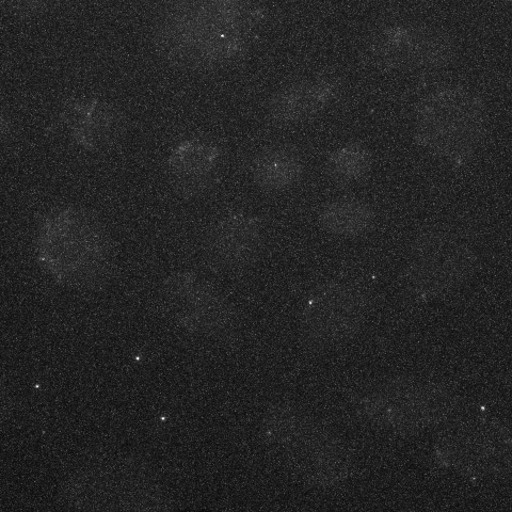
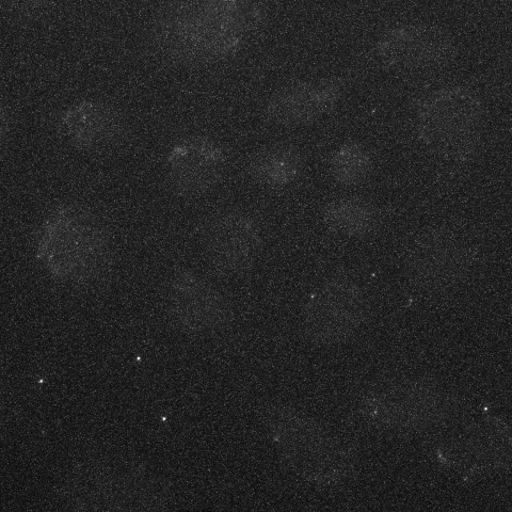
...
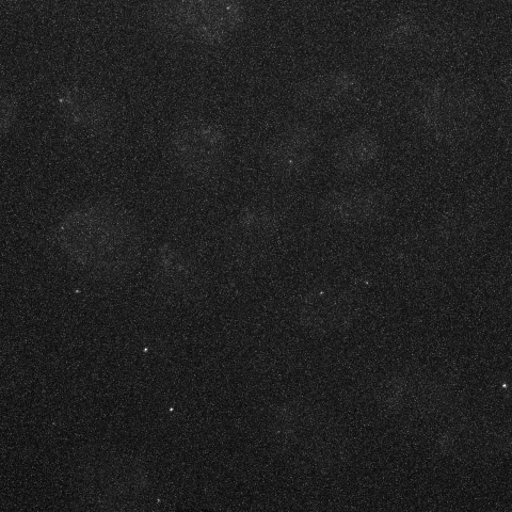
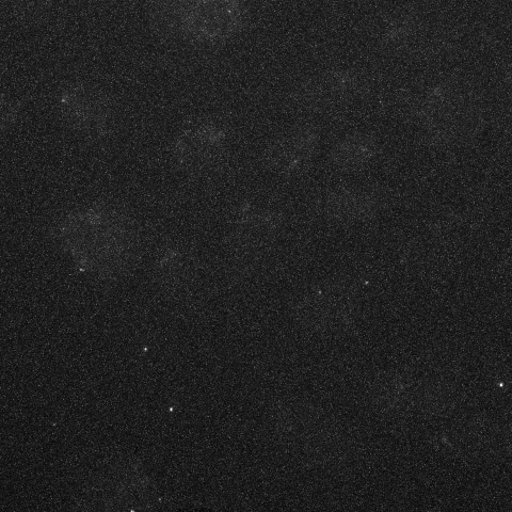
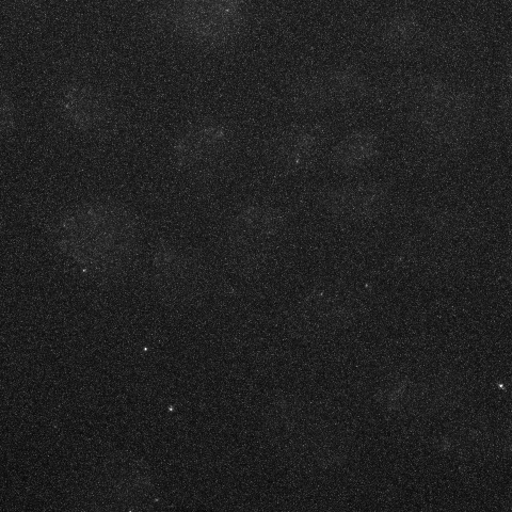
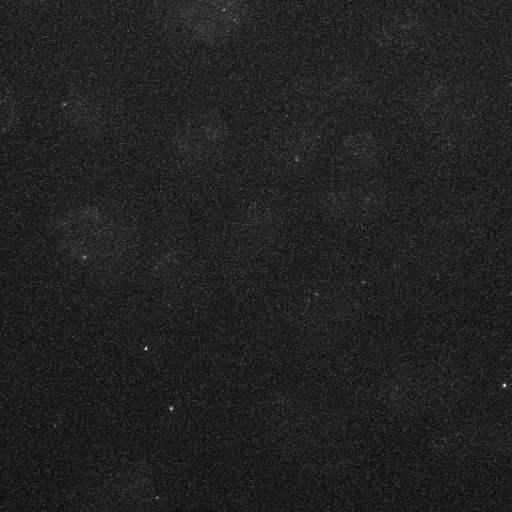
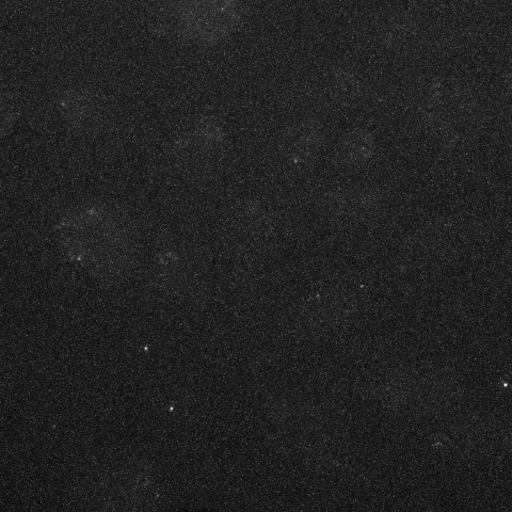

In [4]:
reader.bundle_axes = 'tyx'
reader.iter_axes = 't'
reader.default_coords['c'] = 1
# frames = reader
reader[0]


In [5]:
reader.bundle_axes = 'yx'

In [6]:
reader.default_coords['c'] = 1
a = np.array(reader[:])
reader.default_coords['c'] = 2
green = np.array(reader[:])
reader.default_coords['c'] = 0
blue = np.array(reader[:])
a.shape

(41, 480, 480)

In [7]:
_frame = 40 #@param {type:"integer"}
#@markdown ---
#@markdown ### Enter the intensity cut
_mass = 39500 #@param {type:"slider", min:0, max:1e5, step:100}

#@markdown ---
#@markdown ### Enter the diameter of the particle expected
_diam = 7 #@param {type:"slider", min:3, max:19, step:2}

f = tp.batch(a,7,minmass=_mass,
             processes=-1,
             engine='numba'
            )
# tp.subpx_bias(f)
# plt.hist(f['mass'], bins=20)

f = f[((f['mass'] > _mass) & (f['size'] < 2.25) & (f['mass'] < 4e6)
             &          (f['ecc'] < 0.5)
            )
           ]

Frame 40: 10 features


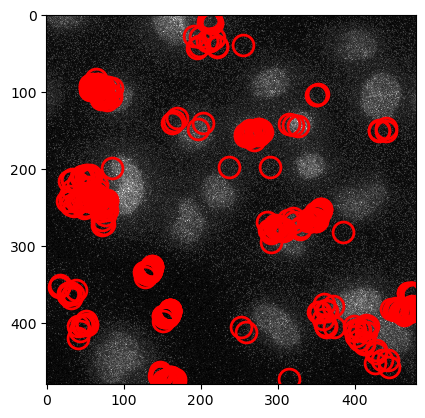

In [8]:
i=30
tp.annotate(f, reader[i]);

In [9]:
_distance = 75
_mem = 4
links = tp.link(f, search_range=_distance,memory=_mem)
links = tp.filter_stubs(links, 5)


Frame 40: 10 trajectories present.


In [10]:
links

,y,x,mass,size,ecc,signal,raw_mass,ep,frame,particle
frame,,,,,,,,,,
0,10.827132,214.437489,49762.321004,1.408130,0.394571,7489.773678,647228.0,0.138379,0,0
0,457.629573,444.628902,61706.777499,1.377000,0.154929,8691.292840,563678.0,0.253767,0,1
0,402.764792,361.865221,64253.241876,1.455622,0.338993,7804.659058,616731.0,0.165916,0,2
0,397.409121,151.418634,149179.393473,1.515613,0.144448,17050.749948,859988.0,0.064127,0,3
0,382.675156,450.752970,135500.459642,1.372527,0.167231,18865.741454,804717.0,0.074514,0,4
...,...,...,...,...,...,...,...,...,...,...
40,267.774821,338.695393,56943.211230,1.278970,0.249868,8758.172169,576134.0,0.209567,40,14
40,276.887128,297.649352,49978.635544,1.368037,0.139942,7042.107822,586178.0,0.192346,40,6
40,326.127914,136.423311,106520.869504,1.395183,0.137994,14673.992544,725708.0,0.089816,40,5


In [12]:
# df_all['ID'] = df_all.index
# nuclei_spots =  df_all.loc[:,['t','y','x']]
# .to_numpy()
# points = 
# import napari
# v = napari.Viewer()
# v.add_image(a)
# # _points = f.loc[:,['frame','y','x']]
# # _metadata = f.loc[:,['mass','size','ecc']]
# _points = links.loc[:,['frame','y','x']]
# _metadata = links.loc[:,['mass','size','ecc','particle']]
# points_options = dict(face_color=[0]*4,edge_color='red',opacity=0.2,size=4)
# v.add_points(_points,properties=_metadata, **points_options )
# # nuclei_spots =  df_all.loc[:,['t','y','x']]
# v.add_tracks(links.loc[:,['particle','frame','y','x']])
# # links.loc[[:,columns=]]
# # f.loc[:,['mass','size','ecc']]

In [13]:
# f['index_ori'] = f.index
# f

In [14]:
# btrack.config.save_config('/media/jmamede/Joao/Anwar/particle_anwar.json',cfg)
# 
# plt.imshow(make_labels_trackpy_links(a[0],test,size=5)[0])
i = 5
print(make_labels_trackpy_links(a[i],links[links['frame'] ==i],size=3)[0].max())
print(len(links[links['frame'] ==i].index))

14
14


In [15]:
####YAY WORKS!!!
masks = np.zeros(a.shape).astype('int64')
idx = []
# links.loc[:,['particle','frame','y','x']]
for i in links.frame.unique():

    temp = links[links['frame'] == i].sort_values(by=['y'])
    #0 returns mask, 1 index returns coords
    mask_temp, idx_temp = make_labels_trackpy_links(a[i],temp,size=5)
#     print(mask_temp.max(),len(temp.index))
#     idx.append(idx_temp)
    mask_fixed = np.copy(mask_temp)
    for j in np.unique(mask_temp).astype('int'):
        if j != 0:
            mask_fixed[mask_temp == j] = temp.iloc[j-1]['particle'].astype('int')
#     print(np.unique(mask_fixed),temp['particle'].unique())
    masks[i,...] = mask_fixed

In [17]:
points_options = dict(face_color=[0]*4,edge_color='red',opacity=0.5,size=5)
v = napari.Viewer()
v.add_image(a,colormap='red',name='mRuby3-IN',blending='additive')
v.add_image(green,colormap='green',name='IGFP',blending='additive')
v.add_image(blue,colormap='blue',name='Nucspot650',blending='additive')
v.add_points(  f.loc[:,['frame','y','x']],properties=_metadata,**points_options)

# nuclei_spots =  df_all.loc[:,['t','y','x']]
v.add_tracks(links.loc[:,['particle','frame','y','x']],name='trackpy')
v.add_labels(masks)
# links.loc[[:,columns=]]
# f.loc[:,['mass','size','ecc']]
# v.add_tracks(data,name='btrack')

<Labels layer 'masks' at 0x7ff53d0e0a00>

In [16]:
backgrounds = {}

for i, clr in enumerate([679,597,525]):
    reader.default_coords['c'] = i
    backgrounds[clr] = np.mean(reader[:])


In [19]:
df = pd.DataFrame()
rgb = np.stack([a,green,blue])
for i in range(masks.shape[0]):
    df_clr = pd.DataFrame()
    for color in range(rgb.shape[0]):
        df_one = pd.DataFrame.from_dict(regionprops_table(masks[i,...],rgb[color,i,...],  
                                        properties= (
                                # 'perimeter',
                                'label',
    #                             'eccentricity',
    #                             'image_intensity',
                                'intensity_mean',
                                'intensity_max',
                                'intensity_min',
    #                             'area',
    #                             'centroid',
    #                             'orientation',
    #                             'axis_major_length',
    #                             'axis_minor_length',
                                # 'feret_diameter_max',
    #                             'solidity',
                                        )
                                                              ))
        
        ##ORDER IS RGB not experiment!
        if color == 0:
#             df_one['color'] = int(reader.metadata.ChannelEmissionWavelength(0,color))
            df_one['color'] = 597
        elif color == 1:
            df_one['color'] = 525
        elif color == 2:
            df_one['color'] = 679
        df_clr = pd.concat([df_clr,df_one])


    df_clr['frame'] = i
    df = pd.concat([df,df_clr])
                                        

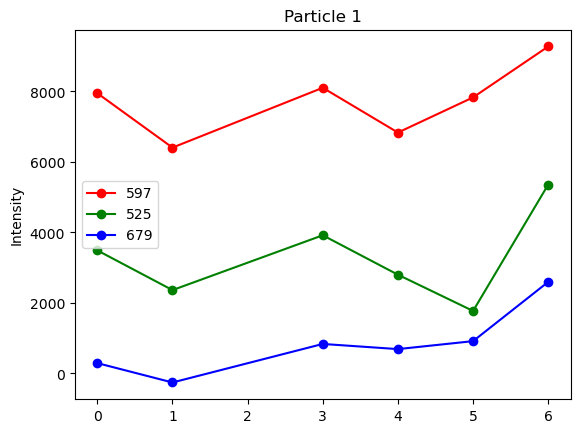

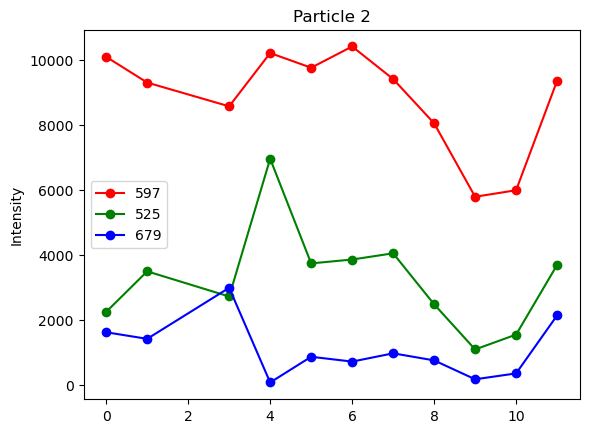

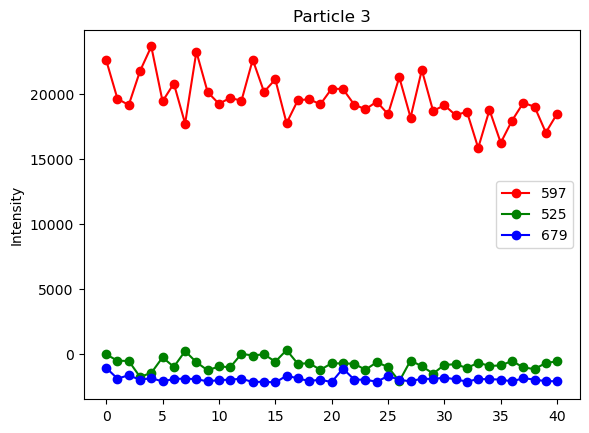

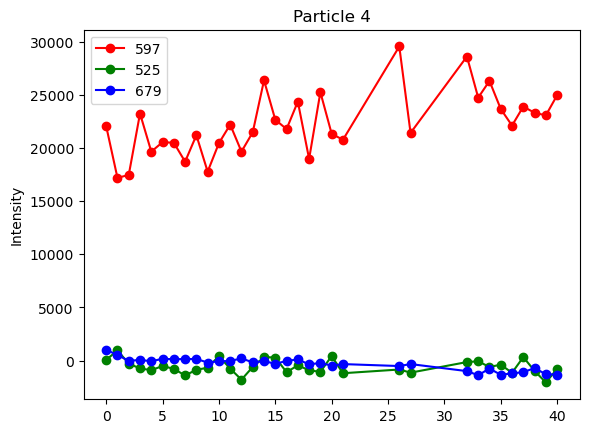

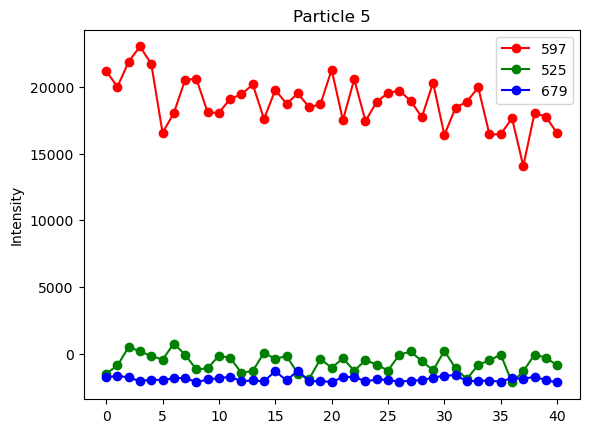

...

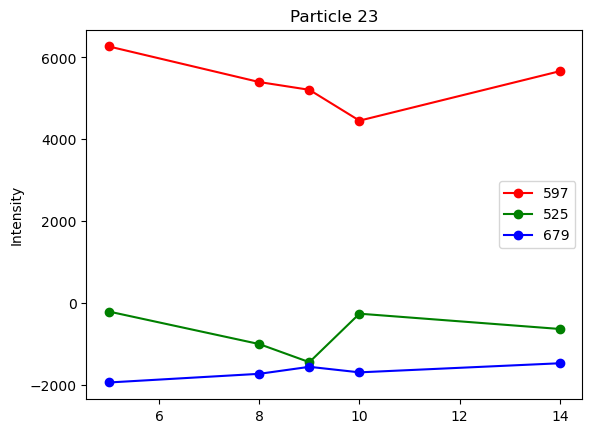

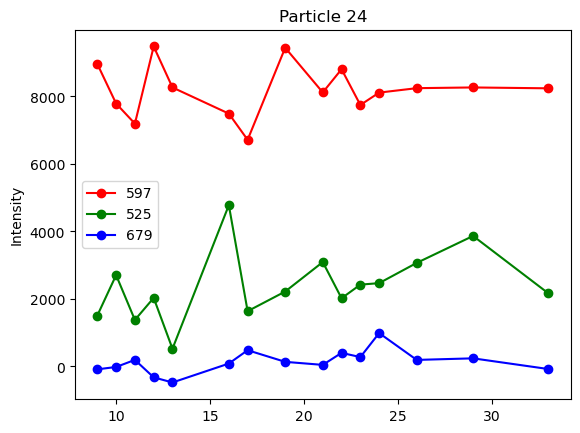

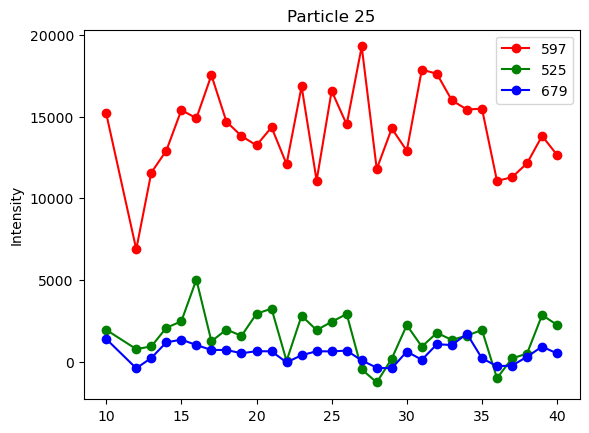

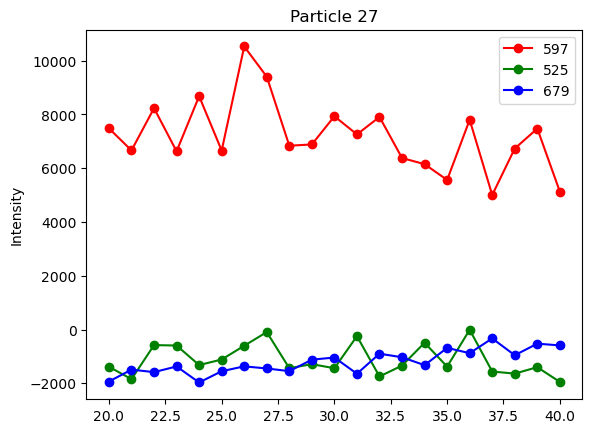

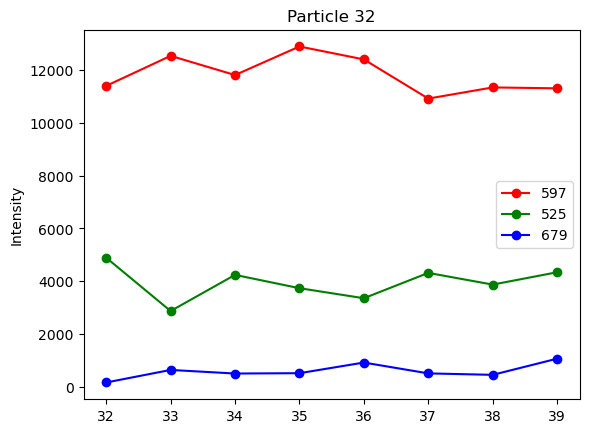

: 

In [20]:
%matplotlib inline
plot_clr = {679:'blue',597:'red',525:'green'}
for particle in df.label.unique():
    plt.figure()
    for i,clr in enumerate(df.color.unique()):
#         print(clr)
        
        with plt.rc_context({'figure.facecolor':'white'}):
            plt.title('Particle '+str(particle))
            plt.ylabel('Intensity')
            df1 = df[df['label'] == particle]
            subtract = backgrounds[clr]
            plt.plot(df1[df1['color'] == clr].frame,df1[df1['color'] == clr].intensity_mean - subtract,
                     marker='o',label=clr,color=plot_clr[clr])
            plt.legend()
#     plt.close()
            

In [ ]:
g = links
g = g.rename(columns={"particle": "ID","frame":"t"})
g

In [ ]:
import btrack

# objects = []
# mass	size	ecc	signal	raw_mass	
g.loc[:,['mass','size','ecc']]
objects = btrack.dataio.localizations_to_objects(g.loc[:,['ID','t','y','x','mass','size','ecc','signal','raw_mass']])
# for row in g.loc[:,['ID','t','y','x','mass','size','ecc','signal',"raw_mass"]].to_dict('records'):
#     objects.append(btrack.btypes.PyTrackObject.from_dict(row))

#  skimage.measure.regionprops_table()

# FEATURES = ["area", "major_axis_length", "minor_axis_length", "orientation"]
FEATURES = ["mass", 
            "signal",
            "raw_mass"
           ]

In [ ]:
objects

In [ ]:
from btrack import datasets
CONFIG_FILE = datasets.particle_config()
# CONFIG_FILE = btrack.config.load_config("/media/jmamede/Joao/Anwar/particle_anwar.json")

In [ ]:
reader

In [ ]:
with btrack.BayesianTracker() as tracker:

    # configure the tracker using a config file
    tracker.configure(CONFIG_FILE)
    tracker.max_search_radius = 75
    tracker.tracking_updates = ["MOTION",
                                "VISUAL"
                               ]
    tracker.features = FEATURES

    # append the objects to be tracked
    tracker.append(objects)

    # set the tracking volume
    tracker.volume=((0, 480), (0, 480))

    # track them (in interactive mode)
    tracker.track(step_size=50)

    # generate hypotheses and run the global optimizer
    tracker.optimize()

    # get the tracks in a format for napari visualization
    data, properties, graph = tracker.to_napari()
    
    # store the tracks
    tracks = tracker.tracks
    
    # store the configuration
    cfg = tracker.configuration
#     btrack.config.save_config('/media/jmamede/Joao/Anwar/particle_anwar.json',cfg)
    # export the track data 
    # tracker.export("tracks.h5", obj_type="obj_type_1")
    

In [ ]:

v = napari.Viewer()
v.add_image(a,colormap='red',name='mRuby3-IN',blending='additive')
v.add_image(green,colormap='green',name='IGFP',blending='additive')
v.add_image(blue,colormap='blue',name='Nucspot650',blending='additive')
v.add_points(  f.loc[:,['frame','y','x']],properties=_metadata,**points_options)

# nuclei_spots =  df_all.loc[:,['t','y','x']]
v.add_tracks(links.loc[:,['particle','frame','y','x']],name='trackpy')
v.add_labels(masks)
# links.loc[[:,columns=]]
# f.loc[:,['mass','size','ecc']]
v.add_tracks(data,name='btrack')